In [61]:
import os
import sys
import json
import numpy as np
import time
from PIL import Image, ImageDraw

In [62]:
# Set the ROOT_DIR variable to the root directory of the Mask_RCNN git repo
ROOT_DIR = 'C:/Users\maxmi/Desktop/Bachelorarbeit/Mask_RCNN'
assert os.path.exists(ROOT_DIR), 'ROOT_DIR does not exist. Did you forget to read the instructions above? ;)'

# Import mrcnn libraries
sys.path.append(ROOT_DIR) 
from mrcnn.config import Config
import mrcnn.utils as utils
from mrcnn import visualize
import mrcnn.model as modellib


## Set up logging and pre-trained model paths


In [63]:
# Directory to save logs and trained model
MODEL_DIR = os.path.join(ROOT_DIR, "logs")

# Local path to trained weights file
COCO_MODEL_PATH = os.path.join(ROOT_DIR, "mask_rcnn_coco.h5")

# Download COCO trained weights from Releases if needed
if not os.path.exists(COCO_MODEL_PATH):
    utils.download_trained_weights(COCO_MODEL_PATH)

## Configuration

In [64]:
class customConfig(Config):
    """Configuration for training on the krater dataset.
    Derives from the base Config class and overrides values specific
    to krater dataset.
    """
    # Give the configuration a recognizable name
    NAME = "krater"

    # Train on 1 GPU and 1 image per GPU. Batch size is 1 (GPUs * images/GPU).
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1

    # Number of classes (including background)
    NUM_CLASSES = 1 + 1  # background + 1 (crater)

    # All of our training images are 1920x1440
    IMAGE_MIN_DIM = 1920
    IMAGE_MAX_DIM = 1920

    # You can experiment with this number to see if it improves training
    STEPS_PER_EPOCH = 2000

    # This is how often validation is run. If you are using too much hard drive space
    # on saved models (in the MODEL_DIR), try making this value larger.
    VALIDATION_STEPS = 50
    
    # Matterport originally used resnet101, but I downsized to fit it on my graphics card
    BACKBONE = 'resnet101'

    #Custom Optimisierung
    #Training
    TRAIN_ROIS_PER_IMAGE = 128
    RPN_ANCHOR_SCALES = (16, 32, 64, 128, 256)
    RPN_TRAIN_ANCHORS_PER_IMAGE = 512
    POST_NMS_ROIS_TRAINING = 128

    #Inferenz
    MAX_GT_INSTANCES = 1024
    POST_NMS_ROIS_INFERENCE = 1024
    DETECTION_NMS_THRESHOLD = 0.8
    DETECTION_MAX_INSTANCES = 1024
    RPN_NMS_THRESHOLD = 0.8
    
config = customConfig()
config.display()


Configurations:
BACKBONE                       resnet101
BACKBONE_STRIDES               [4, 8, 16, 32, 64]
BATCH_SIZE                     1
BBOX_STD_DEV                   [0.1 0.1 0.2 0.2]
COMPUTE_BACKBONE_SHAPE         None
DETECTION_MAX_INSTANCES        10000
DETECTION_MIN_CONFIDENCE       0.7
DETECTION_NMS_THRESHOLD        0.8
FPN_CLASSIF_FC_LAYERS_SIZE     1024
GPU_COUNT                      1
GRADIENT_CLIP_NORM             5.0
IMAGES_PER_GPU                 1
IMAGE_CHANNEL_COUNT            1
IMAGE_MAX_DIM                  1920
IMAGE_META_SIZE                14
IMAGE_MIN_DIM                  1920
IMAGE_MIN_SCALE                0
IMAGE_RESIZE_MODE              square
IMAGE_SHAPE                    [1920 1920    1]
LEARNING_MOMENTUM              0.9
LEARNING_RATE                  0.001
LOSS_WEIGHTS                   {'rpn_class_loss': 1.0, 'rpn_bbox_loss': 1.0, 'mrcnn_class_loss': 1.0, 'mrcnn_bbox_loss': 1.0, 'mrcnn_mask_loss': 1.0}
MASK_POOL_SIZE                 14
MASK_SHAPE      

# Define the dataset

In [65]:
class CocoLikeDataset(utils.Dataset):
    """ Generates a COCO-like dataset, i.e. an image dataset annotated in the style of the COCO dataset.
        See http://cocodataset.org/#home for more information.
    """
    def load_data(self, annotation_json, images_dir):
        """ Load the coco-like dataset from json
        Args:
            annotation_json: The path to the coco annotations json file
            images_dir: The directory holding the images referred to by the json file
        """
        # Load json from file
        json_file = open(annotation_json)
        coco_json = json.load(json_file)
        json_file.close()
        
        # Add the class names using the base method from utils.Dataset
        source_name = "coco_like"
        for category in coco_json['categories']:
            class_id = category['id']
            class_name = category['name']
            if class_id < 1:
                print('Error: Class id for "{}" cannot be less than one. (0 is reserved for the background)'.format(class_name))
                return
            
            self.add_class(source_name, class_id, class_name)
        
        # Get all annotations
        annotations = {}
        for annotation in coco_json['annotations']:
            image_id = annotation['image_id']
            if image_id not in annotations:
                annotations[image_id] = []
            annotations[image_id].append(annotation)
        
        # Get all images and add them to the dataset
        seen_images = {}
        for image in coco_json['images']:
            image_id = image['id']
            if image_id in seen_images:
                print("Warning: Skipping duplicate image id: {}".format(image))
            else:
                seen_images[image_id] = image
                try:
                    image_file_name = image['file_name']
                    image_width = image['width']
                    image_height = image['height']
                except KeyError as key:
                    print("Warning: Skipping image (id: {}) with missing key: {}".format(image_id, key))
                
                image_path = os.path.abspath(os.path.join(images_dir, image_file_name))
                image_annotations = annotations[image_id]
                
                # Add the image using the base method from utils.Dataset
                self.add_image(
                    source=source_name,
                    image_id=image_id,
                    path=image_path,
                    width=image_width,
                    height=image_height,
                    annotations=image_annotations
                )
                
    def load_mask(self, image_id):
        """ Load instance masks for the given image.
        MaskRCNN expects masks in the form of a bitmap [height, width, instances].
        Args:
            image_id: The id of the image to load masks for
        Returns:
            masks: A bool array of shape [height, width, instance count] with
                one mask per instance.
            class_ids: a 1D array of class IDs of the instance masks.
        """
        image_info = self.image_info[image_id]
        annotations = image_info['annotations']
        instance_masks = []
        class_ids = []
        
        for annotation in annotations:
            class_id = annotation['category_id']
            mask = Image.new('1', (image_info['width'], image_info['height']))
            mask_draw = ImageDraw.ImageDraw(mask, '1')
            for segmentation in annotation['segmentation']:
                mask_draw.polygon(segmentation, fill=1)
                bool_array = np.array(mask) > 0
                instance_masks.append(bool_array)
                class_ids.append(class_id)

        mask = np.dstack(instance_masks)
        class_ids = np.array(class_ids, dtype=np.int32)
        
        return mask, class_ids

# Create the Training and Validation Datasets

In [66]:
dataset_train = CocoLikeDataset()
dataset_train.load_data('../datasets/krater/train/annotations.json', '../datasets/krater/train/images')
dataset_train.prepare()

dataset_val = CocoLikeDataset()
dataset_val.load_data('../datasets/krater/val/annotations.json', '../datasets/krater/val/images')
dataset_val.prepare()

## Display a few images from the training dataset

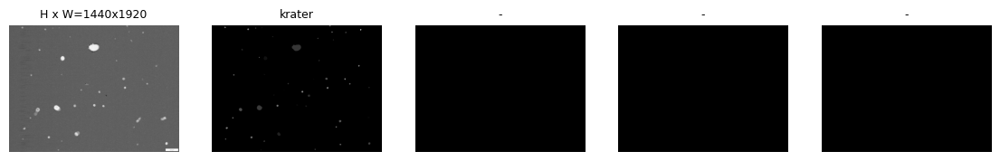

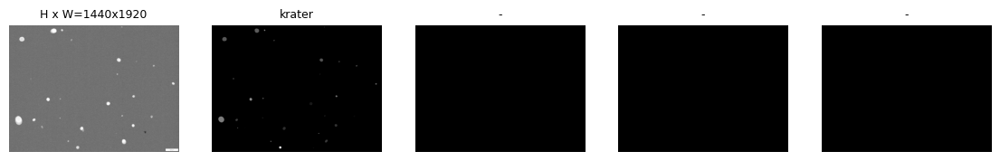

In [67]:
dataset = dataset_train
image_ids = np.random.choice(dataset.image_ids, 2)
for image_id in image_ids:
    image = dataset.load_image(image_id)
    mask, class_ids = dataset.load_mask(image_id)
    visualize.display_top_masks(image, mask, class_ids, dataset.class_names)

# Create the Training Model and Train

In [68]:
# Create model in training mode
model = modellib.MaskRCNN(mode="training", config=config,
                          model_dir=MODEL_DIR)

In [69]:
# Which weights to start with?
init_with = "last"  # imagenet, coco, or last

if init_with == "imagenet":
    model.load_weights(model.get_imagenet_weights(), by_name=True)
elif init_with == "coco":
    # Load weights trained on MS COCO, but skip layers that
    # are different due to the different number of classes
    # See README for instructions to download the COCO weights
    model.load_weights(COCO_MODEL_PATH, by_name=True,
                       exclude=["mrcnn_class_logits", "conv1", "mrcnn_bbox_fc", 
                                "mrcnn_bbox", "mrcnn_mask"])
elif init_with == "last":
    # Load the last model you trained and continue training
    model.load_weights(model.find_last(), by_name=True)

## Training




In [71]:
# Train all layers
# Passing layers="all" trains all layers. You can also 
# pass a regular expression to select which layers to
# train by name pattern.
start_train = time.time()
model.train(dataset_train, dataset_val, 
            learning_rate=config.LEARNING_RATE,
            #learning_rate=config.LEARNING_RATE / 10,
            epochs=25, 
            layers="all")
end_train = time.time()
minutes = round((end_train - start_train) / 60, 2)
print(f'Training took {minutes} minutes')

# Prepare to run Inference

In [72]:
class InferenceConfig(customConfig):
    GPU_COUNT = 1
    IMAGES_PER_GPU = 1
    IMAGE_MIN_DIM = 1920
    IMAGE_MAX_DIM = 1920
    DETECTION_MIN_CONFIDENCE = 0.96
    IMAGE_CHANNEL_COUNT = 1

inference_config = InferenceConfig()

In [73]:
# Recreate the model in inference mode
model = modellib.MaskRCNN(mode="inference", 
                          config=inference_config,
                          model_dir=MODEL_DIR)

In [74]:
# Get path to saved weights
# Either set a specific path or find last trained weights
#model_path = 'C:/Users\maxmi\Desktop\Bachelorarbeit\Mask_RCNN\logs\Model X/mask_rcnn_krater_0023.h5'
model_path = model.find_last()

# Load trained weights (fill in path to trained weights here)
assert model_path != "", "Provide path to trained weights"
print("Loading weights from ", model_path)
model.load_weights(model_path, by_name=True)

Loading weights from  C:/Users\maxmi\Desktop\Bachelorarbeit\Mask_RCNN\logs\Model X/mask_rcnn_krater_0023.h5


# Run Inference

Das aktuelle Arbeitsverzeichnis ist: c:\Users\maxmi\Desktop\Bachelorarbeit\CustomMascRCNN\mask_rcnn
Processing 1 images
image                    shape: (1440, 1920, 1)       min:    0.00000  max:  254.00000  uint8
molded_images            shape: (1, 1920, 1920, 1)    min: -123.00000  max:  131.00000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1920.00000  float64
anchors                  shape: (1, 920700, 4)        min:   -0.09433  max:    1.06098  float32


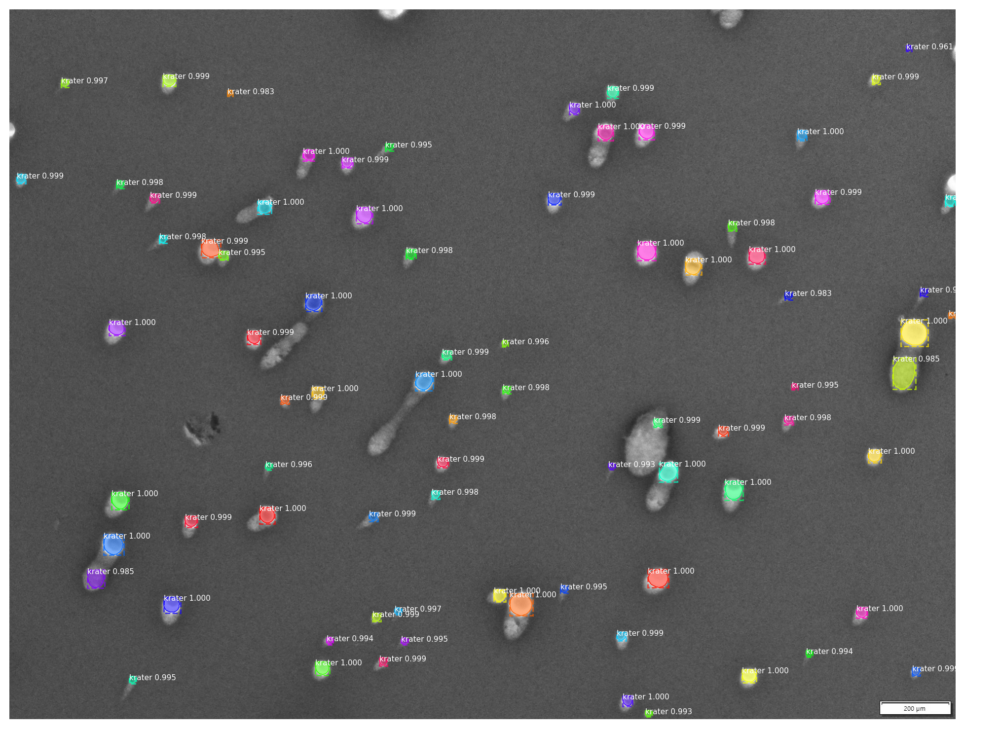

Processing 1 images
image                    shape: (1440, 1920, 1)       min:    0.00000  max:  254.00000  uint8
molded_images            shape: (1, 1920, 1920, 1)    min: -123.00000  max:  131.00000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1920.00000  float64
anchors                  shape: (1, 920700, 4)        min:   -0.09433  max:    1.06098  float32


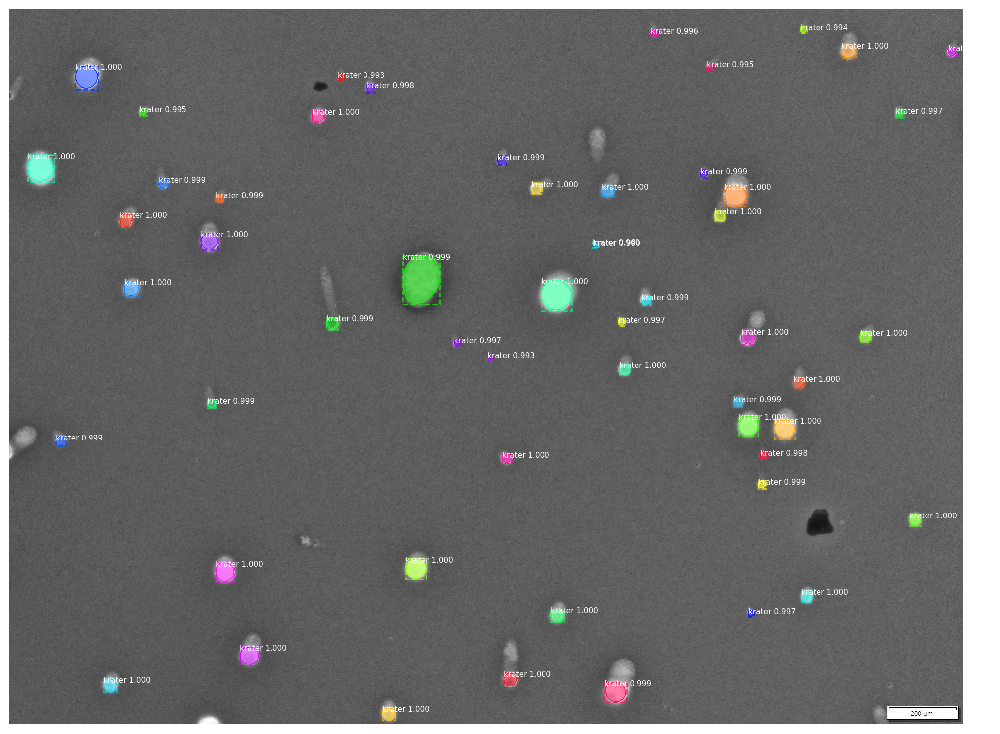

Processing 1 images
image                    shape: (1440, 1920, 1)       min:    0.00000  max:  254.00000  uint8
molded_images            shape: (1, 1920, 1920, 1)    min: -123.00000  max:  131.00000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1920.00000  float64
anchors                  shape: (1, 920700, 4)        min:   -0.09433  max:    1.06098  float32


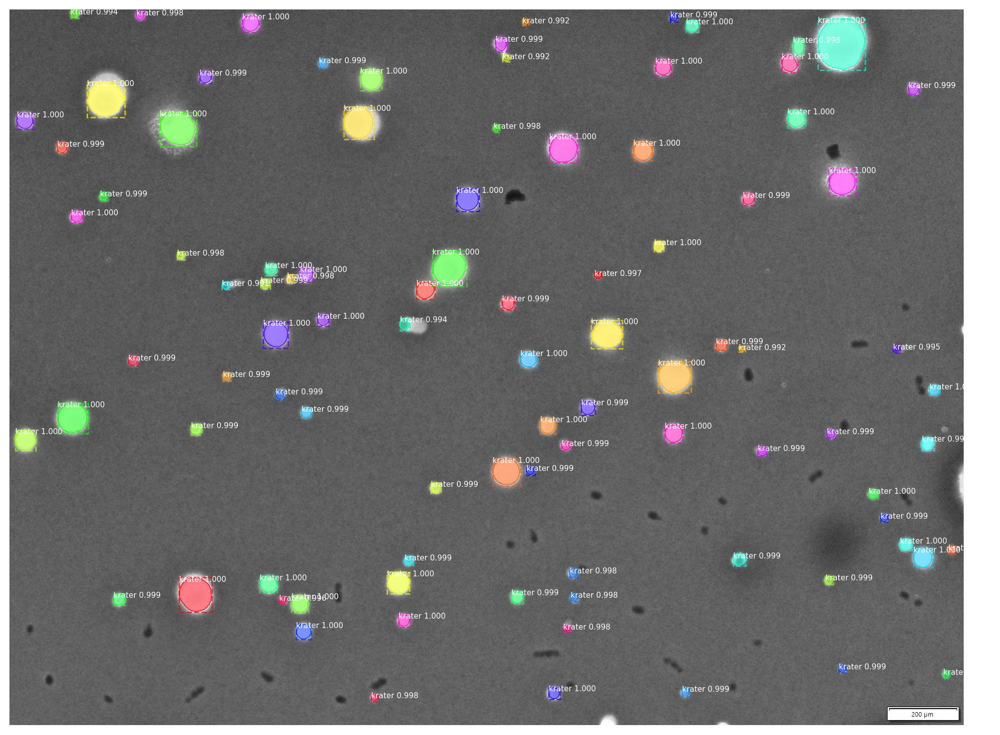

Processing 1 images
image                    shape: (1440, 1920, 1)       min:    0.00000  max:  254.00000  uint8
molded_images            shape: (1, 1920, 1920, 1)    min: -123.00000  max:  131.00000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1920.00000  float64
anchors                  shape: (1, 920700, 4)        min:   -0.09433  max:    1.06098  float32


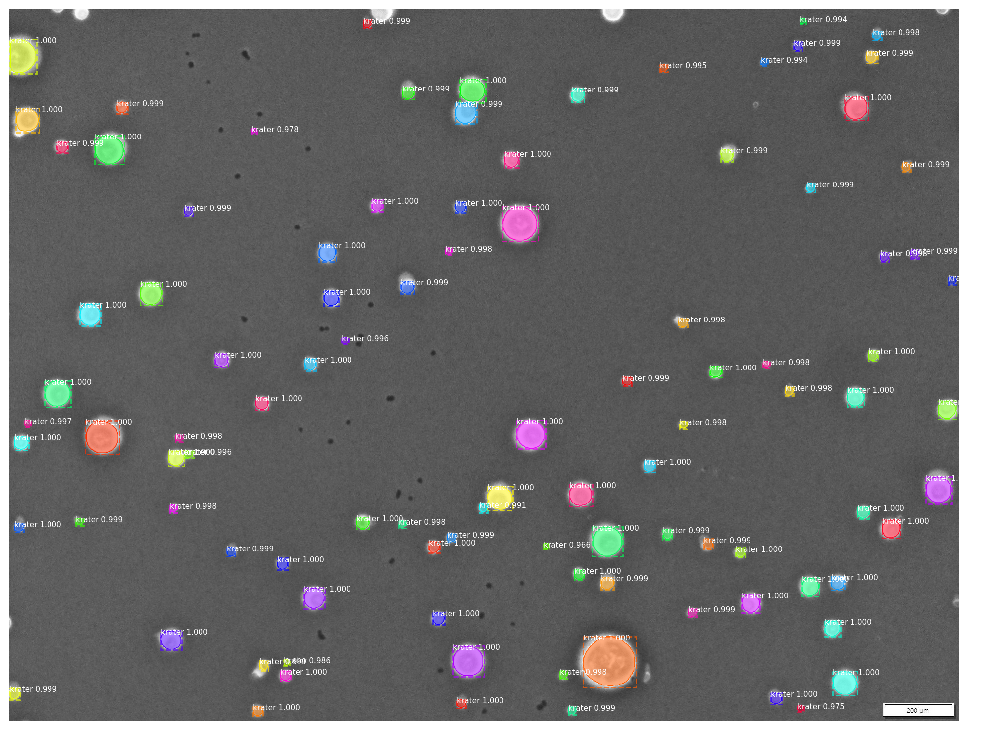

Processing 1 images
image                    shape: (1440, 1920, 1)       min:    0.00000  max:  254.00000  uint8
molded_images            shape: (1, 1920, 1920, 1)    min: -123.00000  max:  131.00000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1920.00000  float64
anchors                  shape: (1, 920700, 4)        min:   -0.09433  max:    1.06098  float32


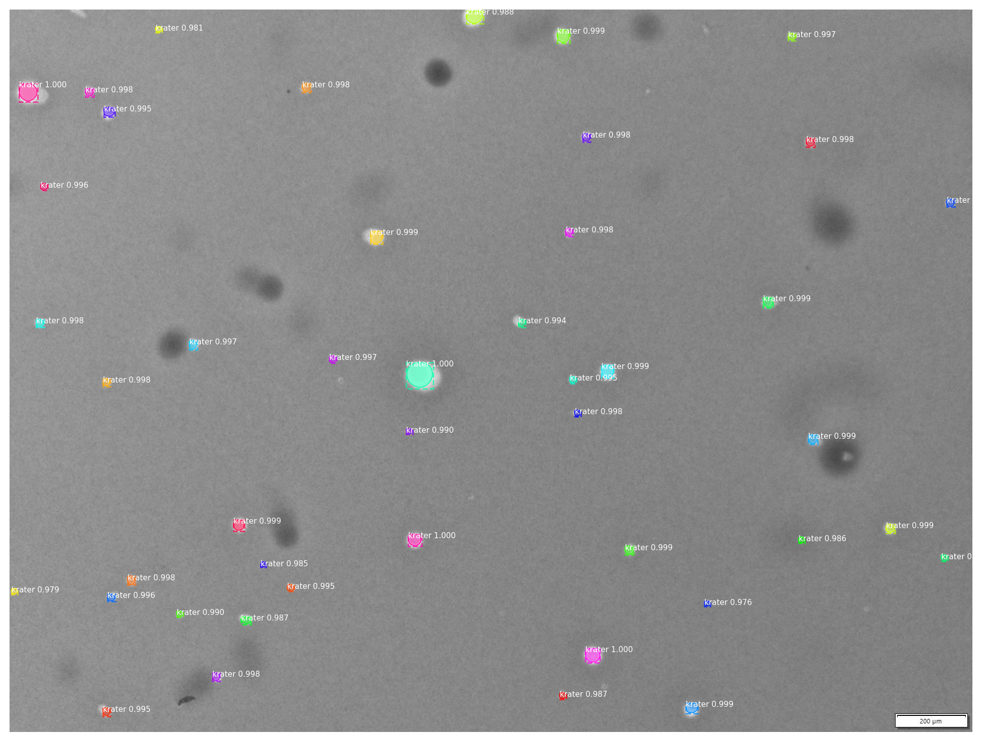

Processing 1 images
image                    shape: (1440, 1920, 1)       min:    0.00000  max:  254.00000  uint8
molded_images            shape: (1, 1920, 1920, 1)    min: -123.00000  max:  131.00000  float64
image_metas              shape: (1, 14)               min:    0.00000  max: 1920.00000  float64
anchors                  shape: (1, 920700, 4)        min:   -0.09433  max:    1.06098  float32


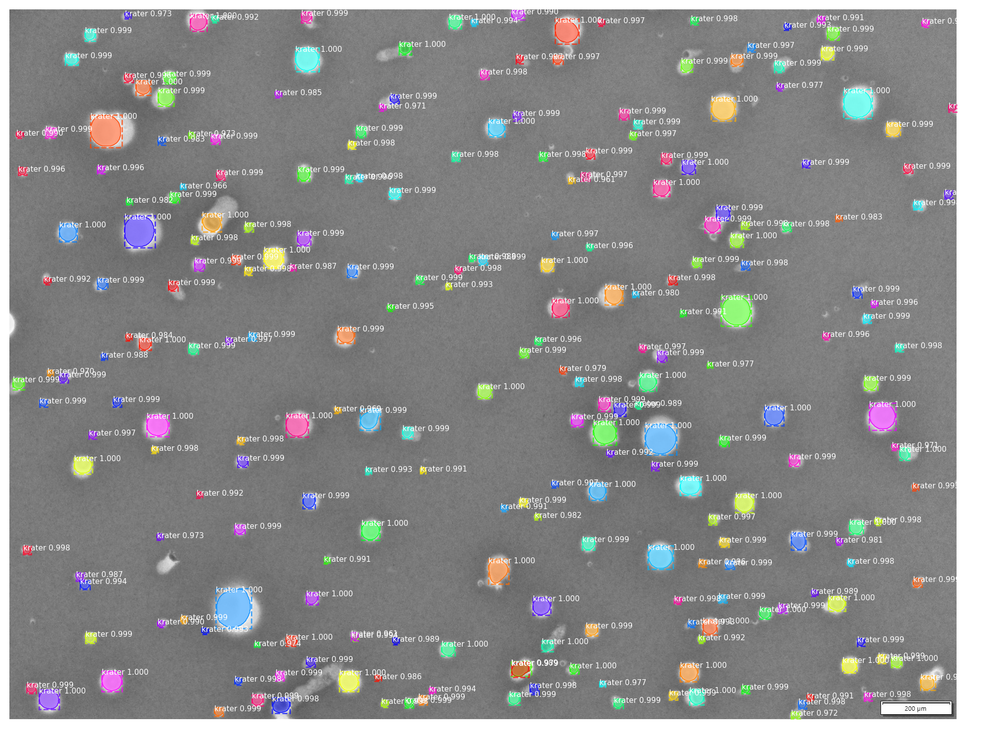

In [75]:
import skimage
import pandas as pd
real_test_dir = 'C:/Users/maxmi/Desktop/Bachelorarbeit/CustomMascRCNN/datasets/krater/real_test'
image_paths = []
data_nr = 1
for filename in os.listdir(real_test_dir):
    if os.path.splitext(filename)[1].lower() in ['.png', '.jpg', '.jpeg']:
        image_paths.append(os.path.join(real_test_dir, filename))

for image_path in image_paths:
    img = skimage.io.imread(image_path)
    img = img.reshape((*img.shape, 1))
    img_arr = np.array(img)
    results = model.detect([img_arr], verbose=1)
    r = results[0]
    # Shape des Graustufenbildes abrufen
    width, height, _ = img.shape

    # Create a new RGB image with the same dimensions
    rgb_image = np.zeros((width, height, 3), dtype=np.uint8)

    # Copy the grayscale values to all three color channels
    rgb_image[:, :, 0] = img[:, :, 0]
    rgb_image[:, :, 1] = img[:, :, 0]
    rgb_image[:, :, 2] = img[:, :, 0]

    img = rgb_image


    visualize.display_instances(img, r['rois'], r['masks'], r['class_ids'], 
    
                                dataset_val.class_names, r['scores'], figsize=((25, 25)))
    
    masks = r['masks']
    areas = []

    areas = []
    for i in range(masks.shape[2]):
        mask = masks[:, :, i]
        area = np.sum(mask)
        areas.append(area)

    # Erstelle ein DataFrame mit den Flächeninhalten
    df = pd.DataFrame({'Fläche': areas})

    # Speichere das DataFrame als CSV-Datei
    df.to_csv(str(data_nr)+'.csv', index=False)
    data_nr = data_nr +1

    